In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pylab as plt
from skimage import io
from skimage.feature import peak_local_max
import math

In [ ]:
urls = [
        'https://i.postimg.cc/LXB0Cz02/im01.jpg',
        'https://i.postimg.cc/xTdF5NGV/im02.jpg'
]

Loading Images from URLs

In [ ]:
images = []

for url in urls:
    images.append(cv2.cvtColor(io.imread(url), cv2.COLOR_BGR2RGB))

Applying Canny Edge Detection

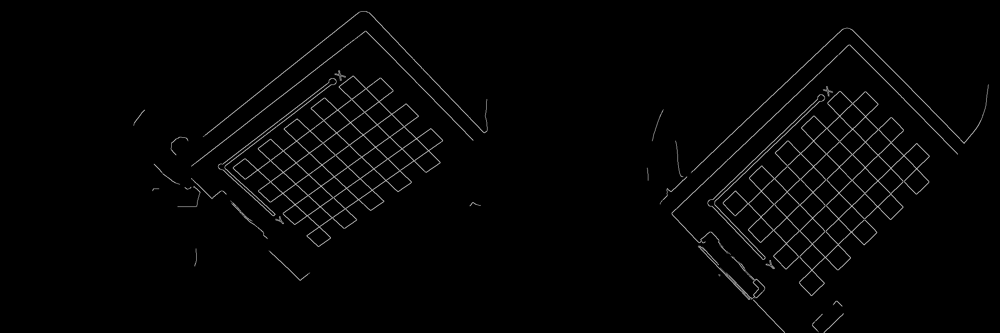

In [ ]:
edges = [cv2.Canny(images[i], 300, 500) for i in range(2)]
cv2_imshow(cv2.hconcat(edges))

#Discretization
We discretize R and Theta in order to move our computations to polar coordinates and preforming hough transform. 

$$r \in [-diag, diag]$$
$$Θ \in [-\frac{Π}{2}, \frac{Π}{2})$$

In [ ]:
diag = np.sqrt(edges[0].shape[0] ** 2 + edges[0].shape[1] ** 2)
R = np.arange(-int(diag), int(diag), 1)
Theta = np.linspace(-math.pi/2, math.pi/2, 1000)

We unwarp coordinates of edges as $(row, col)$ pairs.

In [ ]:
edge_locations = [list(zip(*np.where(edges[i] > 100))) for i in range(2)]

In [ ]:
polar_score = np.zeros((2, len(R), len(Theta)), dtype=np.float64)

This is a matrix of all pairs $(cos(Θ), sin(Θ))$ in each row. 

In [ ]:
theta_matrix = np.concatenate([[np.cos(Theta)], [np.sin(Theta)]], axis=0).T
theta_matrix

array([[ 6.12323400e-17, -1.00000000e+00],
       [ 3.14473221e-03, -9.99995055e-01],
       [ 6.28943332e-03, -9.99980221e-01],
       ...,
       [ 6.28943332e-03,  9.99980221e-01],
       [ 3.14473221e-03,  9.99995055e-01],
       [ 6.12323400e-17,  1.00000000e+00]])

This cell calculate score of each pair of (r, theta). for every edge point we solve for r:

$$r = x \times cos(Θ) + y \times sin(Θ)$$

now for each r, we increament the point of line(r, theta) by one.

In [ ]:
for j in range(2):
    for i in range(len(edge_locations[0])):
        x, y = edge_locations[j][i]
        score_matrix = np.round(theta_matrix @ np.array([[x],[y]])) + int(diag)
        for k in range(len(Theta)):
            polar_score[j, int(score_matrix[k]), k] += 1

This is how our score matrix looks like as an image. The bright points are the ones that were repeated the most.

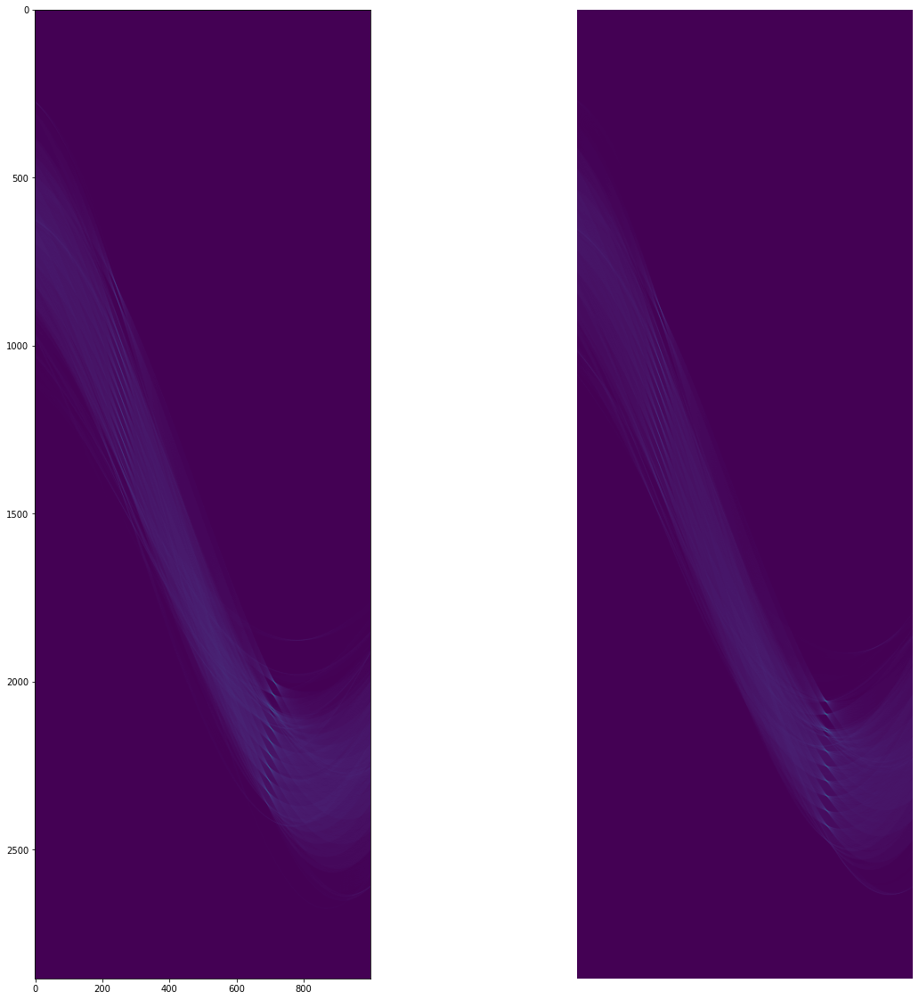

In [ ]:
f, axarr = plt.subplots(1,2, figsize=(20,20))
for i in range(2):
    polar_score[i] = cv2.normalize(polar_score[i], np.zeros(polar_score[i].shape), 0, 1, cv2.NORM_MINMAX)
    plt.axis('off')
    axarr[i].imshow(polar_score[i])
    

In this section we evaluate our score matrix. we look for the pairs of $(r, Θ)$ such that it passes through our image edges. 

In order to what discussed, we find the local maximas of our matrix using sciPy library by the relative threshhold of $0.1$.
Then we divid our pairs to two groups. one with $θ < 0$ and the other with $θ > 0$.

Now we find 50 of the best evaluted thetas for each group and filter the local maximas that only exist in one of these two groups, so we can compare them easier.

Also we sort them by their score in polar_score matrix at the end for upcoming sections.

In [ ]:
coordinates_n = [[], []]
coordinates_p = [[], []]
coordinates= [[], []]

for image_index in range(2):
    coordinates_s = peak_local_max(polar_score[image_index], min_distance=1, threshold_rel=0.1)

    coordinates[image_index] = []

    for r, theta in coordinates_s:
        coordinates[image_index].append((r, theta))


    clean_matrix = np.where(polar_score[image_index]> 0.3, polar_score[image_index], 0)

    cum_f = np.sum(clean_matrix[:, :int(len(Theta)/2)], axis=0)
    cum_index_f = np.unravel_index(np.argsort(- 1 * cum_f, axis=None), cum_f.shape)

    cum_s = np.sum(clean_matrix[:, int(len(Theta)/2):], axis=0)
    cum_index_s = np.unravel_index(np.argsort(- 1 * cum_s, axis=None), cum_s.shape)

    best_sets_n = set()
    best_sets_p = set()

    for i in range(50):
        first_i = cum_index_f[0][i]
        index_set = list((j, first_i) for j in range(polar_score[image_index].shape[0]))
        best_sets_n = best_sets_n.union(index_set)
        second_i = cum_index_s[0][i]
        index_set = list((j, second_i + int(len(Theta)/2)) for j in range(polar_score[image_index].shape[0]))
        best_sets_p = best_sets_p.union(index_set)


    coordinates_n[image_index] = set(coordinates[image_index]).intersection(best_sets_n)
    coordinates_n[image_index] = np.array(list(coordinates_n[image_index]))
    coordinates_scores_n = np.zeros(shape=(coordinates_n[image_index].shape[0]), dtype=float)

    coordinates_p[image_index] = set(coordinates[image_index]).intersection(best_sets_p)
    coordinates_p[image_index] = np.array(list(coordinates_p[image_index]))
    coordinates_scores_p = np.zeros(shape=(coordinates_p[image_index].shape[0]), dtype=float)

    for i in range(coordinates_n[image_index].shape[0]):
        r, theta = coordinates_n[image_index][i]
        coordinates_scores_n[i] = polar_score[image_index, int(r), int(theta)]

    for i in range(coordinates_p[image_index].shape[0]):
        r, theta = coordinates_p[image_index][i]
        coordinates_scores_p[i] = polar_score[image_index, int(r), int(theta)]


    indices_n = coordinates_scores_n.argsort()
    coordinates_n[image_index] = coordinates_n[image_index][indices_n[::-1]]

    indices_p = coordinates_scores_p.argsort()
    coordinates_p[image_index] = coordinates_p[image_index][indices_p[::-1]]

These two functions transfer the line to cartesian coordinates and then return 2 distant points on this line.

$$y = ax + b$$
$$a = - cot(θ)$$
$$b = \frac{r}{\sin(θ)} $$

In [ ]:
def get_cartesian_line(polar):
    r, theta = polar
    if math.sin(theta) == 0:
        return 0, 0
    return -(np.cos(theta)/np.sin(theta)), r/np.sin(theta)

def draw_a_line(polar):
    a, b = get_cartesian_line(polar)
    x_1 = int(-1e4)
    x_2 = int(1e4)
    return (int(a * x_1 + b), x_1), (int(a * x_2 + b), x_2)

As we can see there are too many lines selected that we don't need. We have to filter them out in some way.

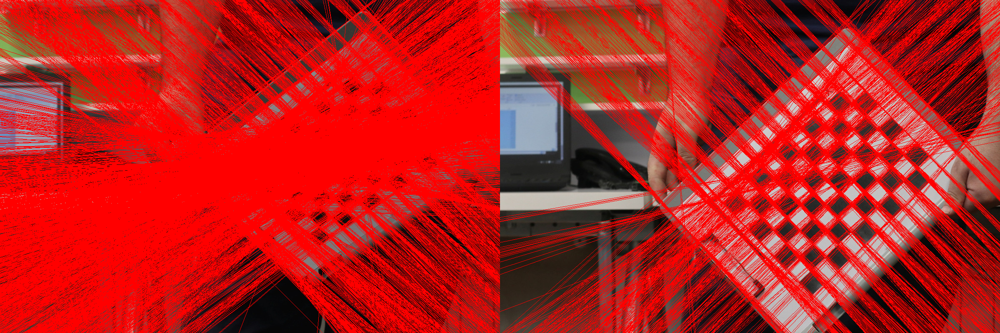

In [ ]:
image = [None for _ in range(2)]
for i in range(2):
    image[i] = images[i].copy()
    for r, theta in coordinates[i]:
        point_s, point_e = draw_a_line((R[r], Theta[theta]))
        image[i] = cv2.line(image[i], point_s, point_e, color=(0, 0, 255), thickness=1)

cv2_imshow(cv2.hconcat(image))

We use Standarad Derivation for this purpose to determin how spreaded is the data. we calculate the std for $r$ and $θ$ in each group and then we consider a interval around mean of the given points to select them.

$$| Mean(R) - r| < alpha \times σ_{r}$$
$$| Mean(Θ) - θ| < beta \times σ_{θ}$$

In [ ]:
def is_line_accepted(polar, std, mean, alpha, beta):
    r, theta = polar
    return np.abs(mean[0]-r) < alpha * std[0] and np.abs(mean[1]-theta) < beta * std[1]


coordinates = [list(), list()]
alpha = [1.4, 1.4]
beta = [0.7, 1]

for i in range(2):
    std_n = np.std(coordinates_n[i], axis=0)
    std_p = np.std(coordinates_p[i], axis=0)
    mean_n = np.mean(coordinates_n[i], axis=0)
    mean_p = np.mean(coordinates_p[i], axis=0)
    for r, theta in coordinates_n[i]:
        if not is_line_accepted((r, theta), std_n, mean_n, alpha[i], beta[i]):
            continue
        coordinates[i].append((r, theta))
    for r, theta in coordinates_p[i]:
        if not is_line_accepted((r, theta), std_p, mean_p, alpha[i], beta[i]):
            continue
        coordinates[i].append((r, theta))

Now we can see that our lines look so much better than before. The lines are almost at the edges we want but there exists several lines for each edge we have.

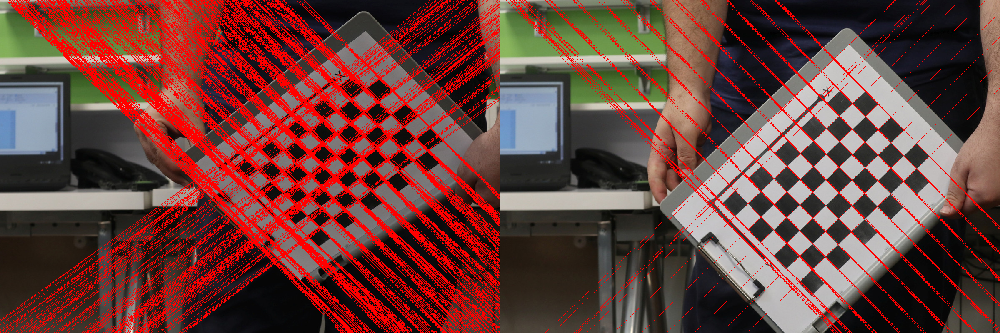

In [ ]:
image = [None for _ in range(2)]
for i in range(2):
    image[i] = images[i].copy()
    for r, theta in coordinates[i]:
        point_s, point_e = draw_a_line((R[r], Theta[theta]))
        image[i] = cv2.line(image[i], point_s, point_e, color=(0, 0, 255), thickness=1)

cv2_imshow(cv2.hconcat(image))

Since we sorted the points by their score in previous sections, we use a simple trick here. for each point we consider a small interval in θ and r for them. if for one of the (r, θ) pairs we already have a line, then we don't add it to our final lines set.
Why? cause a neighbour with a higher value has already been added to final lines set. In this way we choose the peak line for each group of neighbour lines.

In [ ]:
def does_contain_line(lines, polar):
    r, theta = polar
    near_r = np.arange(r - int(0.01 * len(R)),
                       r + int(0.01 * len(R)),
                       1)
    near_theta = np.arange(theta - 0.2 * len(Theta), theta + 0.2 * len(Theta), 1)

    for n_r in near_r:
        for n_t in near_theta:
            if (n_r, n_t) in lines:
                return True

    return False

final_lines = [set(),set()]
for i in range(2):
    for r, theta in coordinates[i]:
        if does_contain_line(final_lines[i], (r, theta)):
            continue
        final_lines[i].add((r, theta))


2


if we take a look at the below picture we can see that almost all the edge lines that we were looking for are selected perfectly.

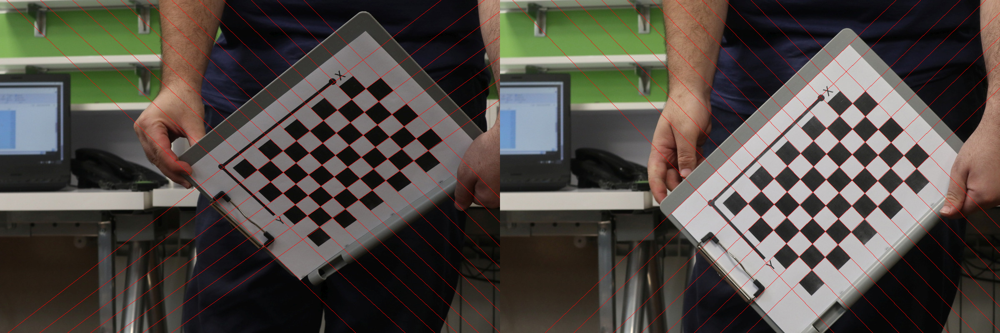

In [ ]:
image = [None for _ in range(2)]
for i in range(2):
    image[i] = images[i].copy()
    for r, theta in final_lines[i]:
        point_s, point_e = draw_a_line((R[r], Theta[theta]))
        image[i] = cv2.line(image[i], point_s, point_e, color=(0, 0, 255), thickness=1)

cv2_imshow(cv2.hconcat(image))

In order to get the coordinates of the intersections of the lines, we simply draw them onnce again with intensity 100, at the end any point that its intensity is higher than 100 is simply a intersection point.

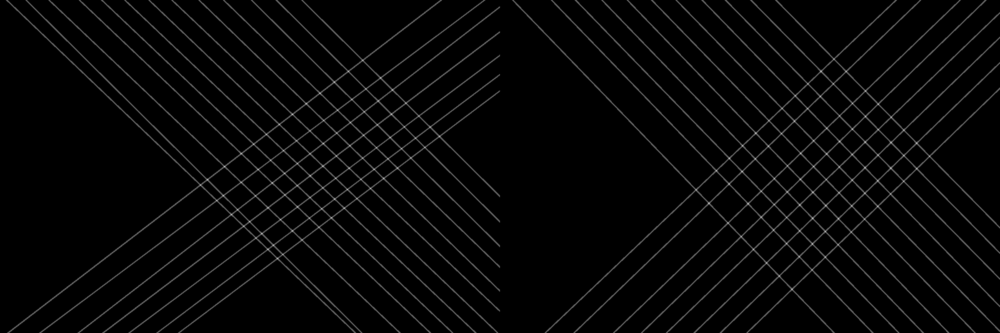

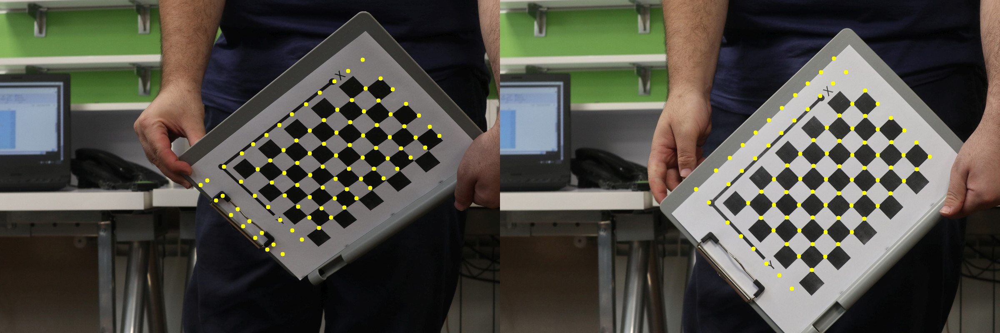

In [ ]:
lines_mask = [None for _ in range(2)]
for i in range(2):
    lines_mask[i] = np.zeros(shape=images[i].shape[:2])
    for r, theta in final_lines[i]:
        point_s, point_e = draw_a_line((R[r], Theta[theta]))
        lines_mask[i] += cv2.line(np.zeros_like(lines_mask[i]), point_s, point_e, color=(100, 100, 100), thickness=2)

cv2_imshow(cv2.hconcat(lines_mask))


cross_points = [[], []]
points_image = [None, None]
for i in range(2):
    cross_points[i] = peak_local_max(lines_mask[i] , min_distance=15, threshold_rel=0.50)
    points_image[i] = images[i].copy()
    for point in cross_points[i]:
        x, y = point
        points_image[i] = cv2.circle(points_image[i], (int(y), int(x)), radius=5, color=(0, 255, 255), thickness=-1)

cv2_imshow(cv2.hconcat(points_image))